## Exploratory Data Analysis

# RAMP on predicting cyclist traffic in Paris


## Introduction

The dataset was collected with cyclist counters installed by Paris city council in multiple locations. It contains hourly information about cyclist traffic, as well as the following features,
 - counter name
 - counter site name
 - date
 - counter installation date
 - latitude and longitude
 
Available features are quite scarce. However, **we can also use any external data that can help us to predict the target variable.** 

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the data with pandas

First, download the data files from Kaggle, and put them to into the data folder.


Data is stored in [Parquet format](https://parquet.apache.org/), an efficient columnar data format. We can load the train set with pandas,

In [2]:
data = pd.read_parquet(Path("data") / "train.parquet")
data.head()

,counter_id,counter_name,site_id,site_name,bike_count,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude,log_bike_count
48321,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 02:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48324,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,1.0,2020-09-01 03:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.693147
48327,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 04:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48330,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,4.0,2020-09-01 15:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,1.609438
48333,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,9.0,2020-09-01 18:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,2.302585


We can check general information about different columns:

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 496827 entries, 48321 to 929187
Data columns (total 12 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   counter_id                 496827 non-null  category      
 1   counter_name               496827 non-null  category      
 2   site_id                    496827 non-null  int64         
 3   site_name                  496827 non-null  category      
 4   bike_count                 496827 non-null  float64       
 5   date                       496827 non-null  datetime64[us]
 6   counter_installation_date  496827 non-null  datetime64[us]
 7   coordinates                496827 non-null  category      
 8   counter_technical_id       496827 non-null  category      
 9   latitude                   496827 non-null  float64       
 10  longitude                  496827 non-null  float64       
 11  log_bike_count             496827 non-null  float64  

and in particular the number of unique entries in each column,

In [4]:
data.nunique(axis=0)

counter_id                     56
counter_name                   56
site_id                        30
site_name                      30
bike_count                    998
date                         8974
counter_installation_date      22
coordinates                    30
counter_technical_id           30
latitude                       30
longitude                      30
log_bike_count                998
dtype: int64

We have a 30 counting sites where sometimes multiple counters are installed per location.  Let's look at the most frequented stations:

In [5]:
(
    data.groupby(["site_name", "counter_name"])["bike_count"].sum()
    .sort_values(ascending=False)
    .head(10)
    .to_frame()
)

/var/folders/5r/98s4tgxs2dvck5m2r8s2mh_m0000gn/T/ipykernel_16646/1192055722.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(["site_name", "counter_name"])["bike_count"].sum()


,,bike_count
site_name,counter_name,
Totem 73 boulevard de Sébastopol,Totem 73 boulevard de Sébastopol S-N,1992227.0
Totem 64 Rue de Rivoli,Totem 64 Rue de Rivoli O-E,1551730.0
Totem 73 boulevard de Sébastopol,Totem 73 boulevard de Sébastopol N-S,1497912.0
67 boulevard Voltaire SE-NO,67 boulevard Voltaire SE-NO,1130565.0
Totem 64 Rue de Rivoli,Totem 64 Rue de Rivoli E-O,1015875.0
27 quai de la Tournelle,27 quai de la Tournelle SE-NO,984914.0
Quai d'Orsay,Quai d'Orsay E-O,948357.0
Totem Cours la Reine,Totem Cours la Reine O-E,894937.0
Face au 48 quai de la marne,Face au 48 quai de la marne SO-NE,884907.0


# Visualizing the data


Let's visualize the data, starting from the spatial distribution of counters on the map

In [6]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [7]:
import folium

m = folium.Map(location=data[["latitude", "longitude"]].mean(axis=0), zoom_start=13)

for _, row in (
    data[["counter_name", "latitude", "longitude"]]
    .drop_duplicates("counter_name")
    .iterrows()
):
    folium.Marker(
        row[["latitude", "longitude"]].values.tolist(), popup=row["counter_name"]
    ).add_to(m)

m

/opt/anaconda3/envs/bikes-count/lib/python3.10/site-packages/folium/utilities.py:86: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coords = (location[0], location[1])


<Axes: xlabel='date'>

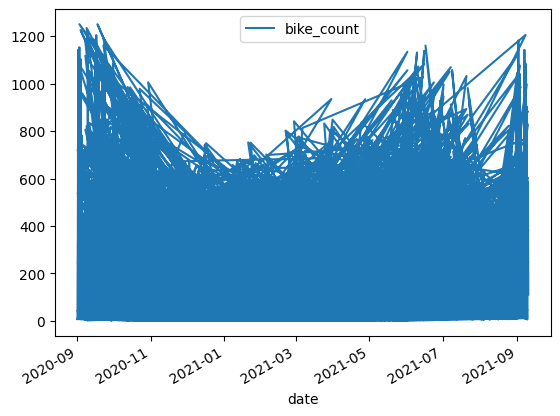

In [8]:
mask = data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N"

data[mask].plot(x="date", y="bike_count")

Instead we aggregate the data, for instance, by week to have a clearer overall picture:

/var/folders/5r/98s4tgxs2dvck5m2r8s2mh_m0000gn/T/ipykernel_16646/1979972553.py:4: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  pd.Grouper(freq="1w", key="date")


<Axes: xlabel='date'>

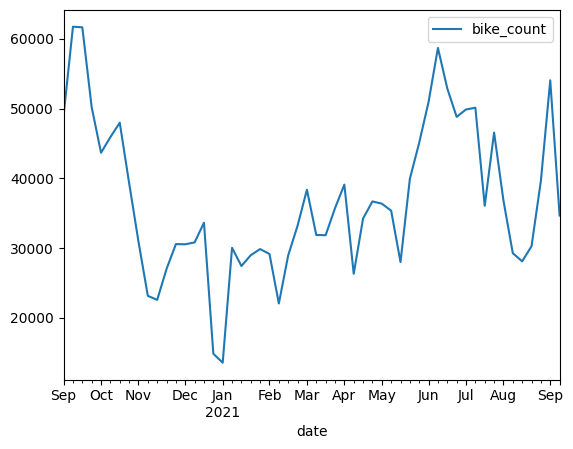

In [9]:
mask = (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")

data[mask].groupby(
    pd.Grouper(freq="1w", key="date")
)[["bike_count"]].sum().plot()

While at the same time, we can zoom on a week in particular for a more short-term visualization,

<Axes: xlabel='date'>

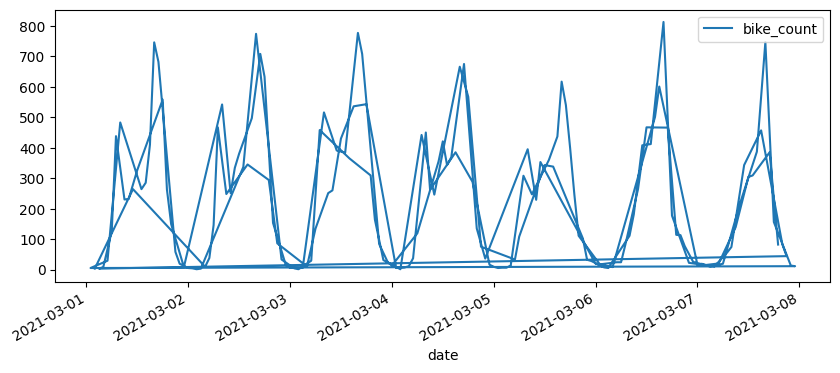

In [10]:
fig, ax = plt.subplots(figsize=(10, 4))

mask = (
    (data["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (data["date"] > pd.to_datetime("2021/03/01"))
    & (data["date"] < pd.to_datetime("2021/03/08"))
)

data[mask].plot(x="date", y="bike_count", ax=ax)

The hourly pattern has a clear variation between work days and weekends (7 and 8 March 2021).

If we look at the distribution of the target variable it skewed and non normal, 

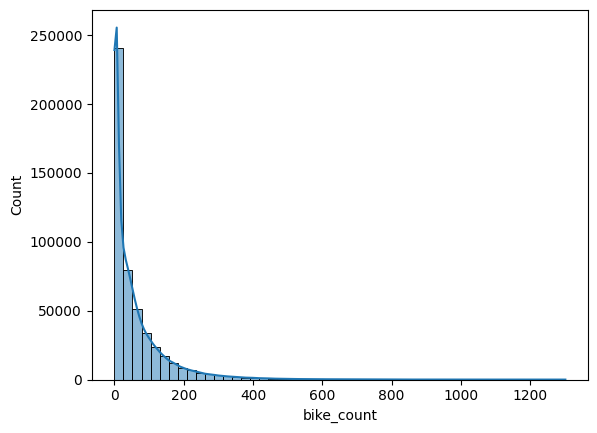

In [11]:
ax = sns.histplot(data, x="bike_count", kde=True, bins=50)

Least square loss would not be appropriate to model it since it is designed for normal error distributions. One way to precede would be to transform the variable with a logarithmic transformation,
```py
data['log_bike_count'] = np.log(1 + data['bike_count'])
```

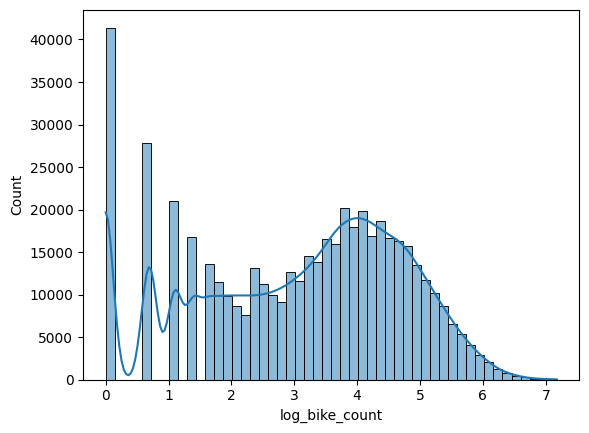

In [12]:
ax = sns.histplot(data, x="log_bike_count", kde=True, bins=50)

which has a more pronounced central mode, but is still non symmetric. In the following, **we use `log_bike_count` as the target variable** as otherwise `bike_count` ranges over 3 orders of magnitude and least square loss would be dominated by the few large values. 

# Missing Values Analysis

In [13]:
print("Missing Values:")
print(data.isnull().sum())

Missing Values:
counter_id                   0
counter_name                 0
site_id                      0
site_name                    0
bike_count                   0
date                         0
counter_installation_date    0
coordinates                  0
counter_technical_id         0
latitude                     0
longitude                    0
log_bike_count               0
dtype: int64


The output shows that there are no missing values, which is a good sign. We do not need to remove any rows or columns due to missing data. 

# Analyze Distributions

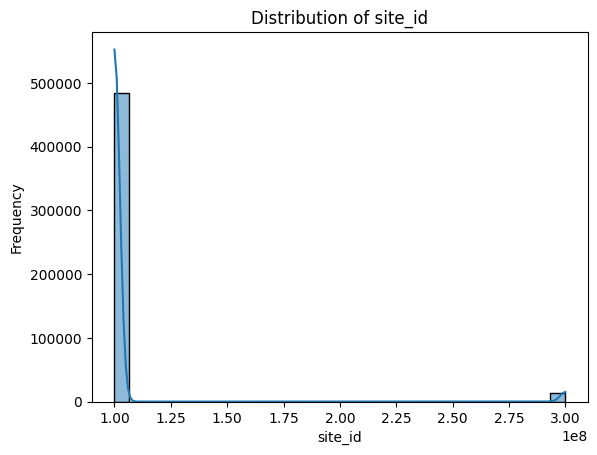

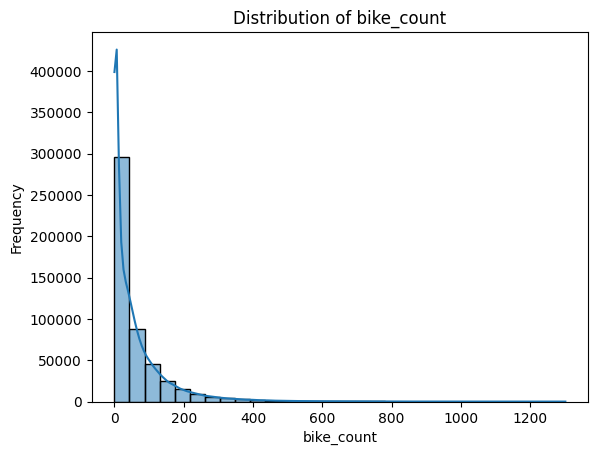

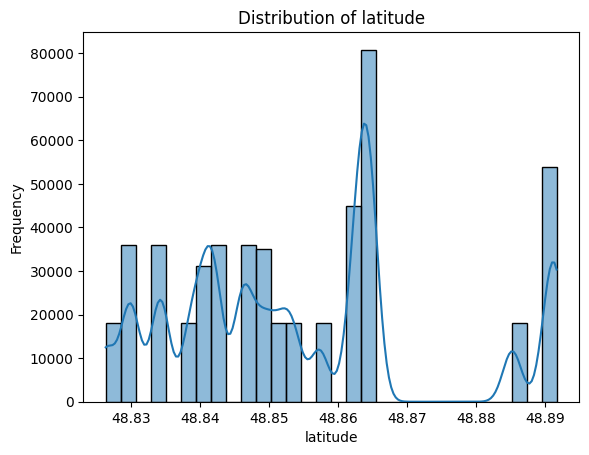

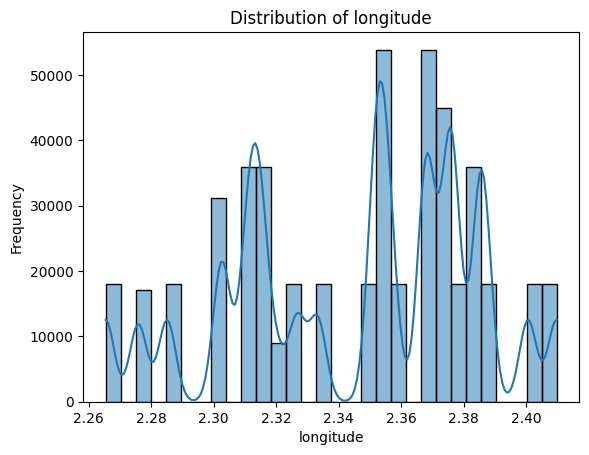

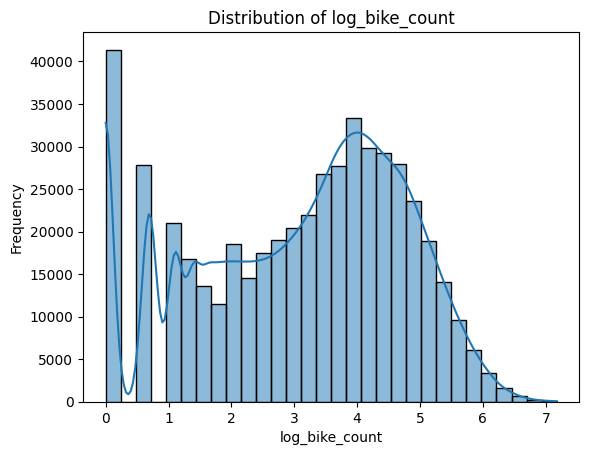

In [14]:
numerical_features = data.select_dtypes(include=["float64", "int64"]).columns
for col in numerical_features:
    sns.histplot(data[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

The site_id distribution shows that almost all data corresponds to a single site_id value, with a very few extreme outliers.
This suggests that most data comes from a limited number of sites.

The bike_count distribution is highly skewed to the right, with most counts being relatively low and a few very high values.
The skewness suggests the need for normalization or transformation (e.g., log transformation) during modeling.

The latitude and longitude distributions show clustering, indicating specific geographical areas where the counters are located.The clustering suggests that bike traffic is concentrated in certain regions of Paris.

The log_bike_count distribution is more symmetric compared to bike_count, but there is still a noticeable peak at 0. The peak at 0 could indicate counters that record no bike traffic during certain periods, which might require further investigation (e.g., faulty counters or inactive periods).

### Study bike_count in more detail

In [15]:
high_bike_count_threshold = data['bike_count'].quantile(0.99)
low_bike_count_threshold = data['bike_count'].quantile(0.01)

print("Bike count outliers:")
outliers = data[(data['bike_count'] > high_bike_count_threshold) | (data['bike_count'] < low_bike_count_threshold)]
print(outliers[['date', 'bike_count']].head())
print(f"Number of outliers: {len(outliers)}")

Bike count outliers:
                      date  bike_count
77684  2020-09-22 06:00:00       428.0
96971  2020-09-01 06:00:00       549.0
96974  2020-09-01 07:00:00       472.0
126158 2020-09-01 07:00:00       514.0
126173 2020-09-01 16:00:00       417.0
Number of outliers: 4968


The outliers occur at specific times of the day:
- 06:00 AM and 07:00 AM: Likely associated with morning rush hours.
- 04:00 PM: Potentially linked to evening peak traffic.
This suggests that high bike counts may be linked to commuting patterns during rush hours.

A significant portion of the dataset qualifies as outliers. While this might initially seem large, it’s expected for events like rush hours, holidays, or other high-traffic periods.

**Next steps:** 
Since these outliers seem reasonable, we don’t need to remove them at this stage. However, *they should be kept in mind when modeling, as they could disproportionately influence certain algorithms (e.g., linear regression).*
We might consider *creating time-based features to capture this trend* (e.g., rush hours, day of the week, holidays).

### Study Geographical Features in more detail

In [16]:
from folium.plugins import HeatMap

m = folium.Map(location=data[["latitude", "longitude"]].mean(axis=0).tolist(), zoom_start=13)

for _, row in data[["counter_name", "latitude", "longitude", "log_bike_count"]].drop_duplicates("counter_name").iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,  
        color="blue", 
        fill=True,
        fill_color="red" if row["log_bike_count"] > 4 else "green", 
        fill_opacity=0.7,
        popup=f"{row['counter_name']}<br>Log Bike Count: {row['log_bike_count']}"
    ).add_to(m)

heat_data = data[["latitude", "longitude", "bike_count"]].values.tolist()
HeatMap(heat_data, min_opacity=0.2, max_zoom=15, radius=15, blur=10).add_to(m)
m

High-traffic areas appear to be concentrated in the central arrondissements of Paris, such as the 1st, 2nd, and 4th arrondissements near landmarks like Les Halles and Île de la Cité.
Traffic intensity decreases as you move to outer arrondissements.

Counters are densely clustered in central areas, indicating that these are popular zones for cycling (likely due to tourist attractions, business districts, and better bike infrastructure).

Fewer or less intense clusters are visible on the outskirts of Paris, such as near Bagnolet or Porte de Pantin.

### Temporal Analysis

In [17]:
data["year"] = data["date"].dt.year
data["month"] = data["date"].dt.month
data["day_of_week"] = data["date"].dt.day_name()  
data["hour"] = data["date"].dt.hour

print(data[["date", "year", "month", "day_of_week", "hour"]].head())

                     date  year  month day_of_week  hour
48321 2020-09-01 02:00:00  2020      9     Tuesday     2
48324 2020-09-01 03:00:00  2020      9     Tuesday     3
48327 2020-09-01 04:00:00  2020      9     Tuesday     4
48330 2020-09-01 15:00:00  2020      9     Tuesday    15
48333 2020-09-01 18:00:00  2020      9     Tuesday    18


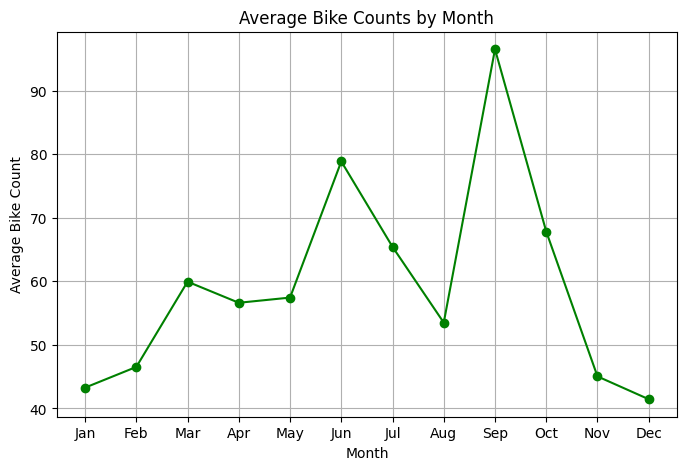

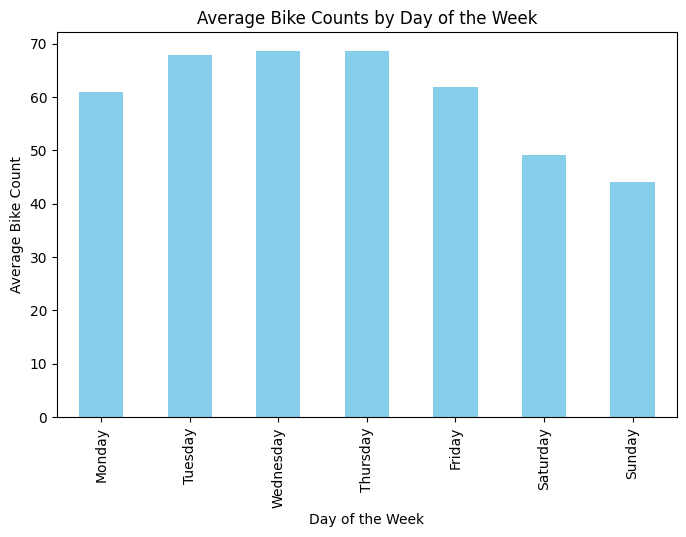

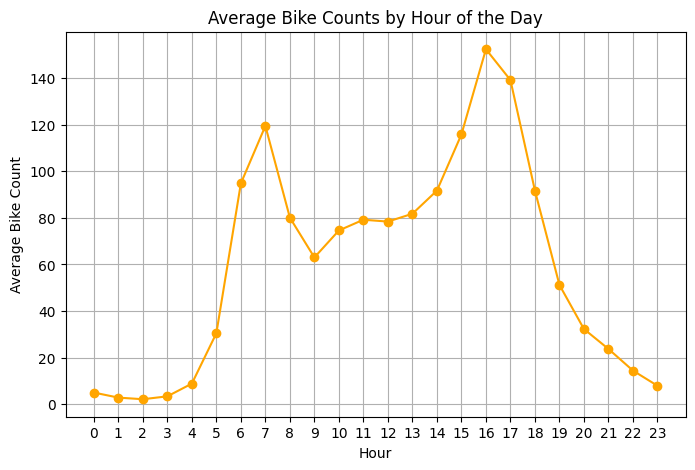

In [18]:
monthly_trends = data.groupby("month")["bike_count"].mean()

plt.figure(figsize=(8, 5))
monthly_trends.plot(kind="line", marker="o", color="green")
plt.title("Average Bike Counts by Month")
plt.xlabel("Month")
plt.ylabel("Average Bike Count")
plt.xticks(range(1, 13), ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
                          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.grid()
plt.show()

weekly_trends = data.groupby("day_of_week")["bike_count"].mean().reindex([
    "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"
])

plt.figure(figsize=(8, 5))
weekly_trends.plot(kind="bar", color="skyblue")
plt.title("Average Bike Counts by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Average Bike Count")
plt.show()

hourly_trends = data.groupby("hour")["bike_count"].mean()

plt.figure(figsize=(8, 5))
hourly_trends.plot(kind="line", marker="o", color="orange")
plt.title("Average Bike Counts by Hour of the Day")
plt.xlabel("Hour")
plt.ylabel("Average Bike Count")
plt.xticks(range(0, 24))
plt.grid()
plt.show()

Monthly trends: 
- Counts are lowest in winter (Dec-Feb) and highest in late summer (Sept).
- Likely influenced by seasonal weather changes.

Weekly trends: 
- Weekdays have higher bike counts, peaking Tuesday-Thursday.
- Weekends show lower counts, with Sunday being the lowest.
- Likely linked to commuting during weekdays.

Daily trends: 
- Peaks occur during morning (7 AM) and evening (4 PM) rush hours.
- Counts drop significantly during midday, aligning with workday schedules.

### Correlations between features

Correlation with log_bike_count:
log_bike_count    1.000000
bike_count        0.738168
latitude          0.113355
longitude         0.044494
site_id           0.020998
Name: log_bike_count, dtype: float64


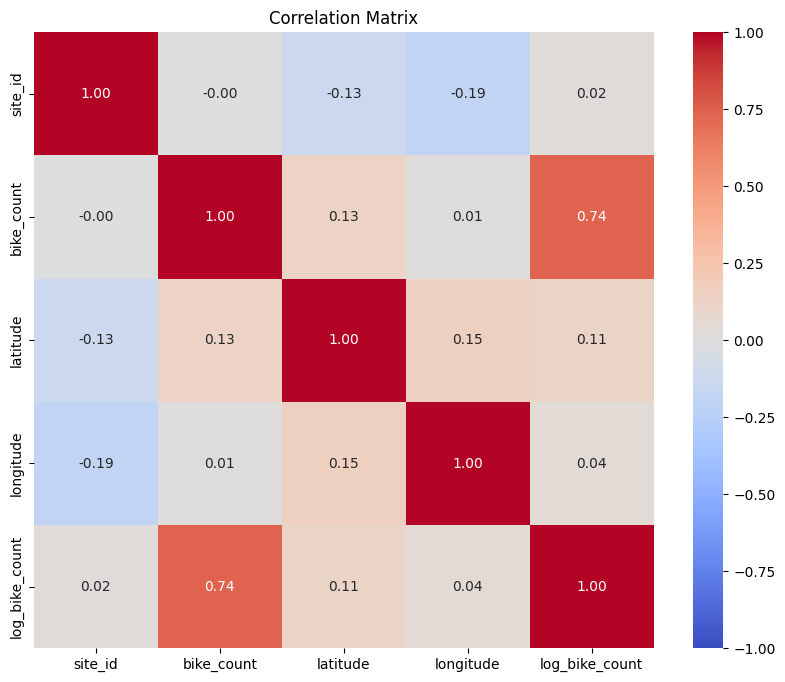

In [19]:
numerical_data = data.select_dtypes(include=["float64", "int64"])

correlation_matrix = numerical_data.corr()

print("Correlation with log_bike_count:")
print(correlation_matrix["log_bike_count"].sort_values(ascending=False))

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

Based on the correlation matrix, there are no strong correlations between the target (log_bike_count) and the other numerical features, apart from bike_count of course. Features like latitude, longitude, and site_id have weak correlations with log_bike_count.
This suggests that other factors, such as temporal trends (e.g., hour, day of the week) or external influences (e.g., weather, events), may play a more significant role.
Derived or transformed features, like distance from city center or interactions between hour and location, could reveal stronger patterns.

Top 5 site_id counts:
site_id
100007049    17948
100036718    17948
100063175    17948
100060178    17948
100057445    17948
Name: count, dtype: int64
Top 5 site_id by average log_bike_count:
site_id
100057445    4.509236
100050876    4.080323
100044493    4.071260
100047542    3.724213
100056336    3.698813
Name: log_bike_count, dtype: float64


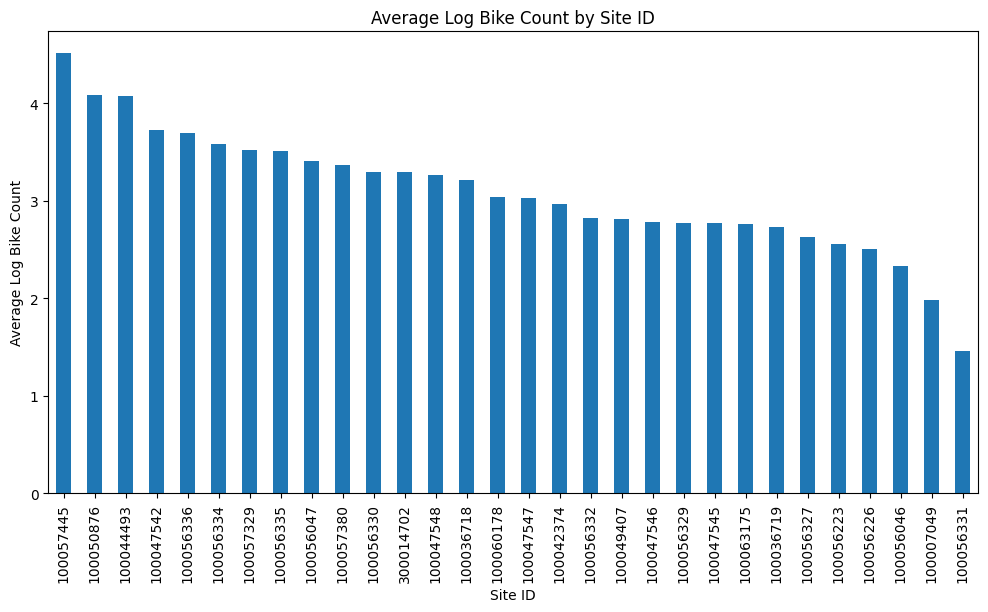

In [20]:
site_counts = data['site_id'].value_counts()
print("Top 5 site_id counts:")
print(site_counts.head())

site_avg_bike_count = data.groupby("site_id")["log_bike_count"].mean().sort_values(ascending=False)
print("Top 5 site_id by average log_bike_count:")
print(site_avg_bike_count.head())

site_avg_bike_count.plot(kind='bar', figsize=(12, 6))
plt.title("Average Log Bike Count by Site ID")
plt.xlabel("Site ID")
plt.ylabel("Average Log Bike Count")
plt.show()

Different site_ids show noticeable variations in their average log_bike_count. 
High traffic sites are likely located in busy areas (e.g., city center, near transit hubs, or tourist attractions).

day_of_week
Friday       3.176330
Monday       3.051329
Saturday     2.962962
Sunday       2.763883
Thursday     3.220589
Tuesday      3.171618
Wednesday    3.205697
Name: log_bike_count, dtype: float64


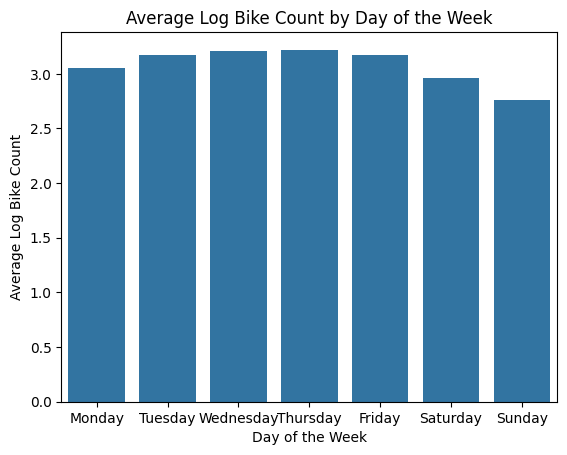

In [21]:
day_avg_bike_count = data.groupby("day_of_week")["log_bike_count"].mean()
print(day_avg_bike_count)

order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

sns.barplot(x='day_of_week', y='log_bike_count', data=data, errorbar=None, order=order)
plt.title("Average Log Bike Count by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Average Log Bike Count")
plt.show()

Average log bike count is higher on weekdays than on weekends (as seen in the graph earlier already). 
We should consider to create binary variables to distinguish between weekend and weekdays. 

### Learning from EDA and next Steps

#### Temporal Trends
- Weekdays exhibit higher bike traffic compared to weekends, with peaks observed on Tuesday, Wednesday, and Thursday.
- Hourly analysis highlights morning (7-9 AM) and evening (4-6 PM) rush hour patterns on weekdays, confirming the influence of commuting behavior.

#### Categorical Features
- Traffic varies significantly across `site_id`, with certain locations showing consistently higher or lower counts. This suggests `site_id` is a key predictor.
- `day_of_week` is strongly correlated with bike usage, with weekdays and weekends showing distinct patterns. This highlights the need to account for workday effects.

#### Numerical Features
- `latitude` and `longitude` have weak direct correlations with `log_bike_count`. Derived features, such as distance to central locations (e.g., Notre-Dame), could make these more useful.
- The transformation of `bike_count` to `log_bike_count` effectively reduces skewness, making the target more suitable for regression models.

#### Data Quality
- The dataset has no missing values, and most features are clean and ready for preprocessing.

#### Next Steps: Feature Engineering
1. **Derived Features**:
   - **Time-based**:
     - Create `is_weekend` (binary: 1 for Saturday/Sunday, 0 otherwise).
     - Group `hour` into categories (e.g., Morning, Afternoon, Evening, Night) to simplify temporal patterns.
   - **Geographic**:
     - Calculate `distance_to_center` using latitude and longitude (e.g., from Notre-Dame).
     - Cluster locations into zones (e.g., Central Paris vs. Outer Arrondissements).
   - **Seasonal**:
     - Add a `season` feature (e.g., Winter, Spring, Summer, Fall) based on `month`.

2. **External Data**:
   - **Weather**:
     - Integrate temperature, precipitation, and wind data to capture weather effects on bike traffic.
   - **Public Holidays**:
     - Add a binary feature for holidays to account for unusual traffic patterns.

3. **Preprocessing**:
   - Encode `site_id` and `day_of_week` using OneHotEncoding or Target Encoding to make them usable in models.
   - Normalize or scale numerical features if required by the model (e.g., distance-based features).

#### Next Steps: Modeling
- Start with baseline models (e.g., Linear Regression, Decision Trees) to test feature effectiveness.
- Validate models with cross-validation and refine features based on performance.

This plan integrates both internal patterns and external factors, ensuring a comprehensive feature set for robust modeling.